## Outdated Data!

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
import sys
if os.path.basename(os.getcwd()) == 'erik':
    os.chdir('..')
if os.getcwd() not in sys.path:
    sys.path.append(os.getcwd())
import util
df = pd.read_csv('data_csv/final_Data_iaaf_scores_neu.csv', sep=';', decimal=',')
df

,jahr,geschlecht,altersklasse,disziplin,leistung,wind,name,geburtsjahr,verein,datum,ort,iaaf_score
0,2017,W,Frauen,100 m,"10,95",1.3,Gina Lueckenkemper,1996,LG Olympia Dortmund,05.08.,London/GBR,1211
1,2017,W,Frauen,100 m,"11,06",1.8,Rebekka Haase,1993,LV 90 Erzgebirge,25.05.,Zeulenroda,1187
2,2017,W,Frauen,100 m,"11,14",-0.2,Lisa Mayer,1996,Sprintteam Wetzlar,27.08.,Berlin,1169
3,2017,W,Frauen,100 m,"11,24",0.3,Tatjana Pinto,1992,LC Paderborn,15.07.,Ninove/BEL,1148
4,2017,W,Frauen,100 m,"11,25",1.9,Sina Mayer,1995,LAZ Zweibruecken,11.06.,Regensburg,1146
...,...,...,...,...,...,...,...,...,...,...,...,...
226678,2023,M,14,Speerwurf,"40,64",NaN,Tizian Zoeger,2010,LAC Aschersleben,29.04.2023,Schoenebeck,545
226679,2023,M,14,Speerwurf,"40,48",NaN,Phil Matthias,2009,SV Halle,07.05.2023,Halle (Saale),543
226680,2023,M,14,Speerwurf,"40,38",NaN,Laurin Steep,2009,MTV Dannenberg,16.09.2023,Fallersleben (Wolfsburg),542
226681,2023,M,14,Speerwurf,"40,36",NaN,Rico Lange,2009,TSV Chemie Premnitz,02.09.2023,Berlin-Lichterfelde,541


#### Wertetabelle bester Disziplinen

In [23]:
import pandas as pd

def generate_discipline_ranking(df):
    # 1. Datenvorbereitung
    df_rank = df.copy()
    df_rank['iaaf_score'] = pd.to_numeric(df_rank['iaaf_score'], errors='coerce')
    df_rank = df_rank.dropna(subset=['iaaf_score'])

    # --- TEIL A: GLOBALER ÜBERBLICK ---
    def get_global_stats(group):
        return pd.Series({
            'Mean_All': group['iaaf_score'].mean(),
            'Mean_Top3': group['iaaf_score'].nlargest(3).mean(),
            'Count': len(group)
        })

    global_ranking = df_rank.groupby('disziplin').apply(get_global_stats, include_groups=False).reset_index()
    # Sortierung nach den Top 3 Leistungen
    global_ranking = global_ranking.sort_values(by='Mean_Top3', ascending=False)

    # --- TEIL B: DIFFERENZIERT NACH GESCHLECHT & ALTER ---
    # Wir nehmen hier die Top 3 Mittelwerte pro Gruppe
    detailed_ranking = df_rank.groupby(['disziplin', 'geschlecht', 'altersklasse'])['iaaf_score'].apply(
        lambda x: x.nlargest(3).mean()
    ).reset_index()
    
    detailed_ranking.columns = ['Disziplin', 'Geschlecht', 'Altersklasse', 'Mean_Top3_Score']
    detailed_ranking = detailed_ranking.sort_values(by='Mean_Top3_Score', ascending=False)

    return global_ranking, detailed_ranking

# Ausführung
ranking_all, ranking_detailed = generate_discipline_ranking(df)

# Ausgabe der Top 10 Disziplinen Deutschlands (Global)
print("--- TOP 10 DISZIPLINEN (GLOBALER DURCHSCHNITT DER TOP 3) ---")
print(ranking_all.head(10).to_string(index=False))
import pandas as pd

def generate_full_performance_rankings(df):
    # 1. Datenvorbereitung
    df_rank = df.copy()
    df_rank['iaaf_score'] = pd.to_numeric(df_rank['iaaf_score'], errors='coerce')
    df_rank = df_rank.dropna(subset=['iaaf_score'])

    # Hilfsfunktion für die Berechnungen
    def get_stats(group):
        return pd.Series({
            'Mean_Score_All': group['iaaf_score'].mean(),
            'Median_Score': group['iaaf_score'].median(),
            'Top_3_Mean': group['iaaf_score'].nlargest(3).mean(),
            'Count': len(group)
        })

    # --- RANKING 1: Global (Alle Leistungen über alle Jahre/Klassen) ---
    global_rank = df_rank.groupby('disziplin').apply(get_stats, include_groups=False).reset_index()
    global_rank = global_rank.sort_values(by='Mean_Score_All', ascending=False)

    # --- RANKING 2: Nach Geschlecht ---
    gender_rank = df_rank.groupby(['disziplin', 'geschlecht']).apply(get_stats, include_groups=False).reset_index()
    gender_rank = gender_rank.sort_values(by=['geschlecht', 'Mean_Score_All'], ascending=[True, False])

    # --- RANKING 3: Nach Altersklasse ---
    age_rank = df_rank.groupby(['disziplin', 'altersklasse']).apply(get_stats, include_groups=False).reset_index()
    age_rank = age_rank.sort_values(by=['altersklasse', 'Mean_Score_All'], ascending=[True, False])

    # --- RANKING 4: Die "Dichte-Tabelle" (Differenz Top 3 zu Gesamtschnitt) ---
    density_rank = global_rank.copy()
    density_rank['Gap_Elite_Field'] = density_rank['Top_3_Mean'] - density_rank['Mean_Score_All']
    density_rank = density_rank.sort_values(by='Gap_Elite_Field', ascending=True) # Kleine Gaps = Hohe Leistungsdichte

    return global_rank, gender_rank, age_rank, density_rank

# Ausführung
global_r, gender_r, age_r, density_r = generate_full_performance_rankings(df)

# Ergebnisse anzeigen (Beispiele)
print("--- TOP 10 DISZIPLINEN NACH GESAMT-DURCHSCHNITT (BREITE) ---")
print(global_r.head(10)[['disziplin', 'Mean_Score_All', 'Count']].to_string(index=False))

print("\n--- TOP 5 DISZIPLINEN MIT DER HÖCHSTEN LEISTUNGSDICHTE (KLEINSTER ABSTAND ZUR SPITZE) ---")
print(density_r.head(5)[['disziplin', 'Mean_Score_All', 'Gap_Elite_Field']].to_string(index=False))
print("\n--- TOP 10 SPEZIFISCHE GRUPPEN (GESCHLECHT & ALTER) ---")
print(ranking_detailed.head(10).to_string(index=False))

# Optional: Speichern als Excel für deinen Report
# ranking_detailed.to_excel("Leichtathletik_Ranking_Deutschland.xlsx")

--- TOP 10 DISZIPLINEN (GLOBALER DURCHSCHNITT DER TOP 3) ---
       disziplin   Mean_All   Mean_Top3   Count
       Speerwurf 796.724057 1321.000000 11930.0
      Weitsprung 930.384458 1268.000000 11234.0
      Kugelstoss 825.743687 1264.333333 11919.0
      Diskuswurf 787.969029 1256.666667 11882.0
  Stabhochsprung 809.772659 1255.666667 12655.0
       Zehnkampf 902.776306 1255.666667  4077.0
      Hochsprung 904.159430 1255.666667 13059.0
          3000 m 812.654326 1232.333333 10669.0
      Hammerwurf 722.662497 1232.000000 11831.0
3000 m Hindernis 917.781073 1227.666667  3170.0
--- TOP 10 DISZIPLINEN NACH GESAMT-DURCHSCHNITT (BREITE) ---
       disziplin  Mean_Score_All   Count
   100 m Huerden      995.286889  3890.0
           200 m      968.296573  7907.0
           400 m      952.393589  8735.0
   110 m Huerden      948.392753  3781.0
           100 m      933.144851 11391.0
          1500 m      932.566286  8667.0
      Weitsprung      930.384458 11234.0
3000 m Hindernis      

#### Lineare Regression der besten Disziplinen (pro Geschlecht und Alter)

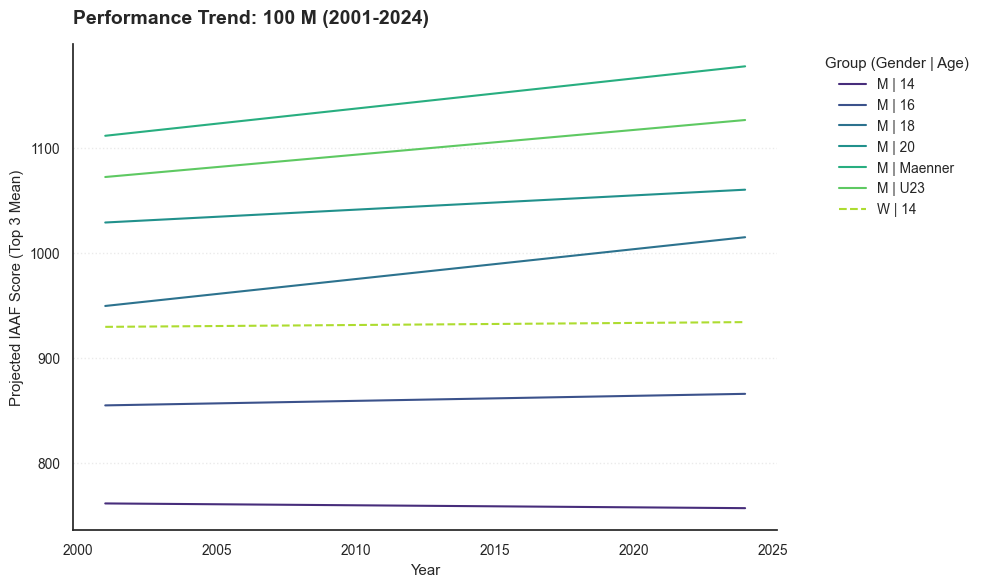

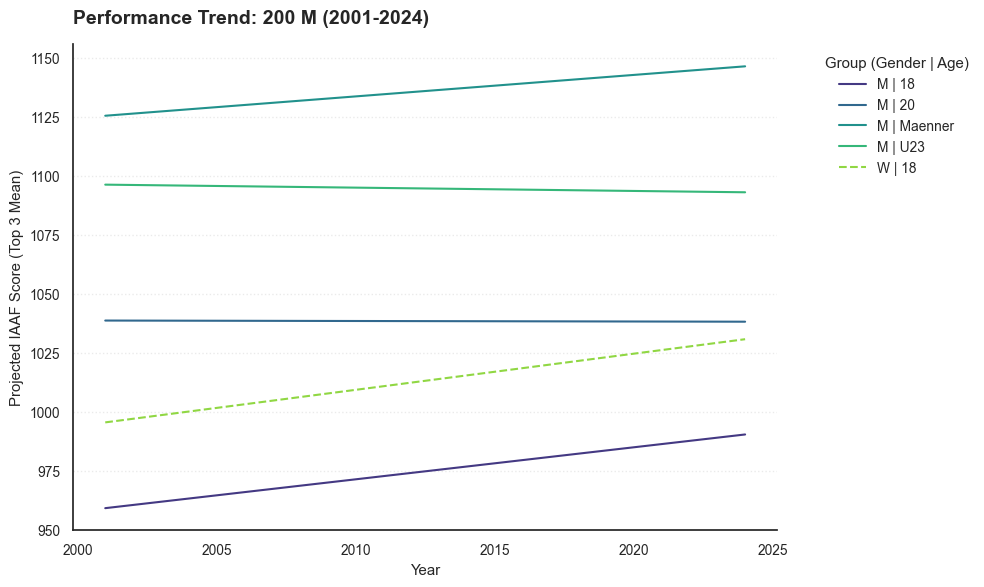

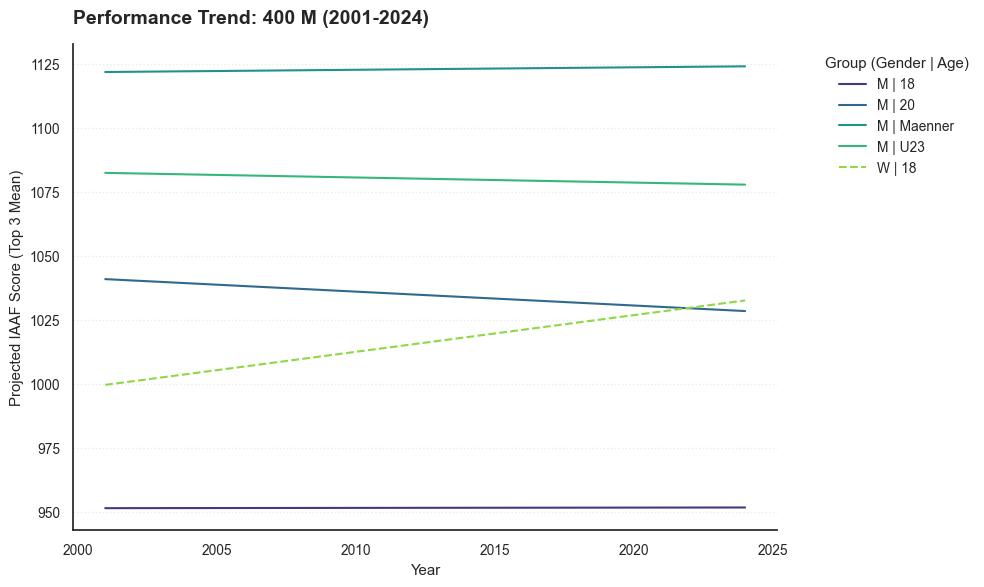

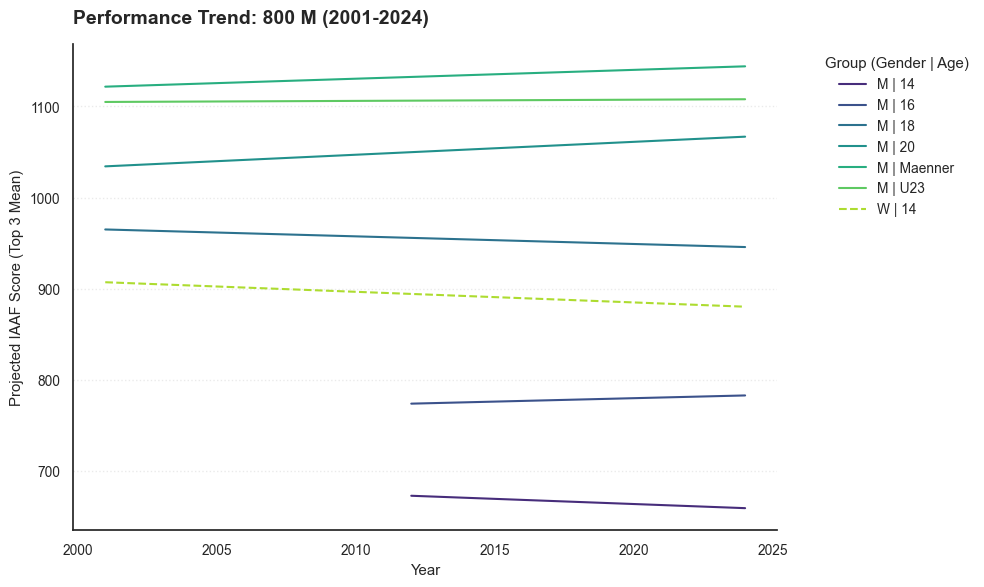

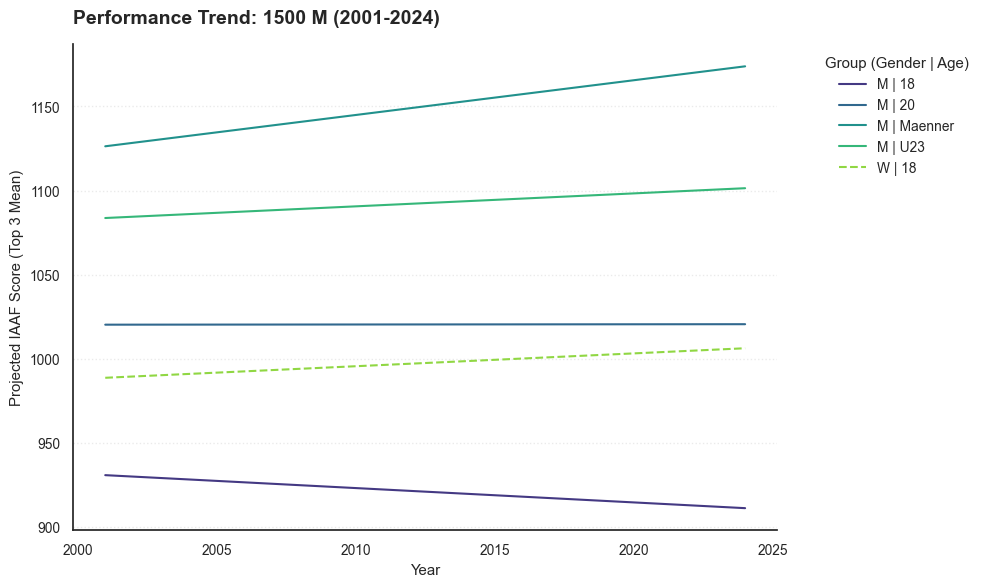

...

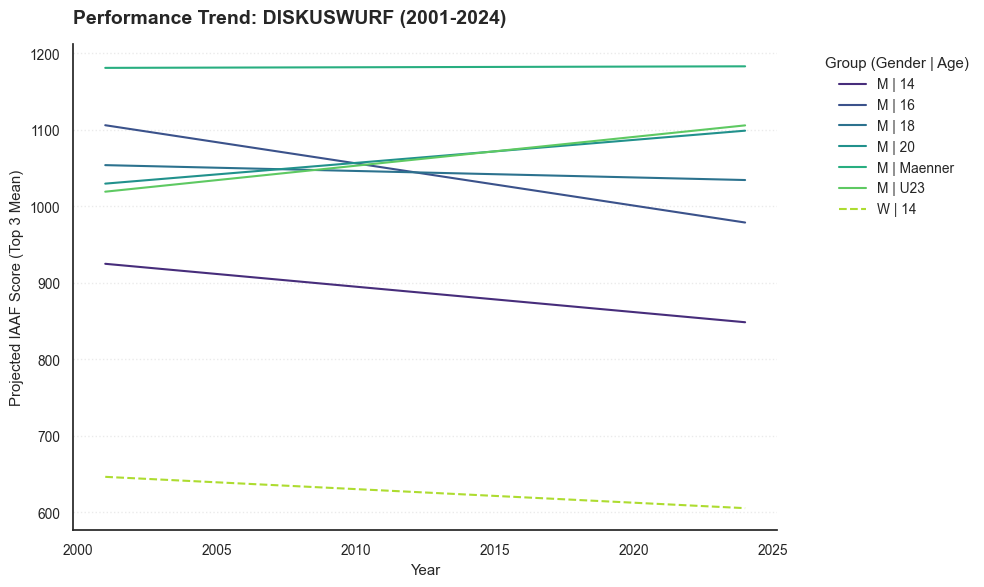

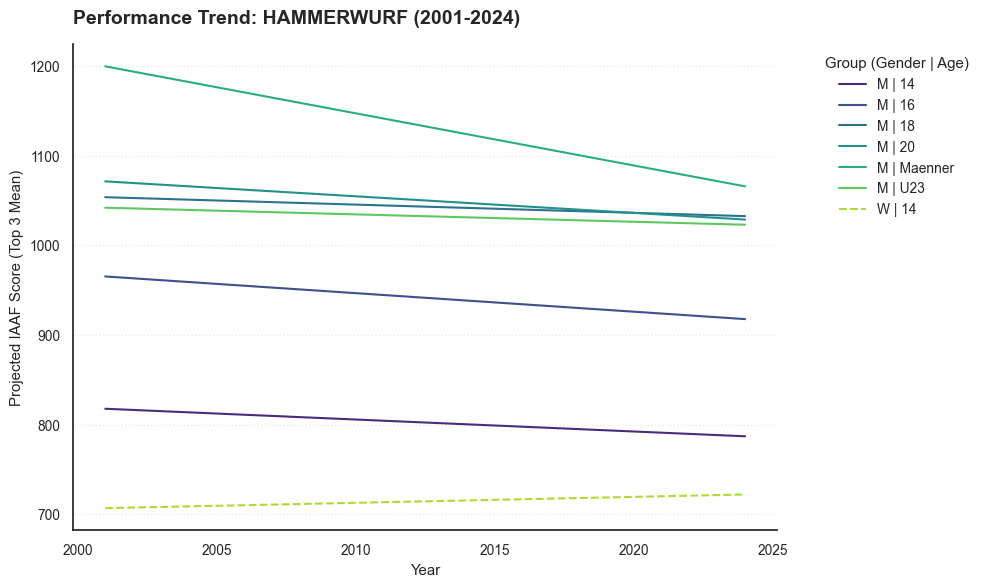

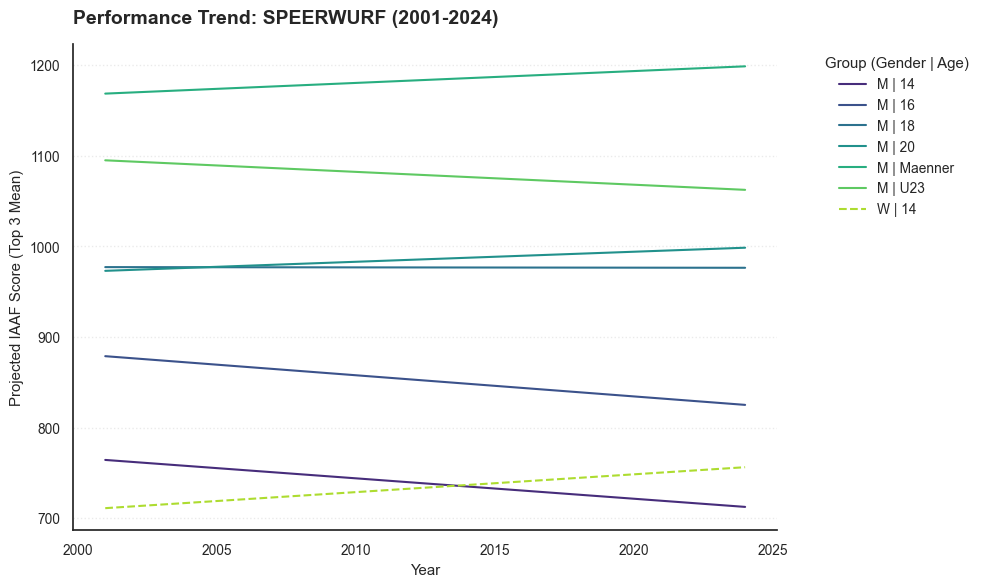

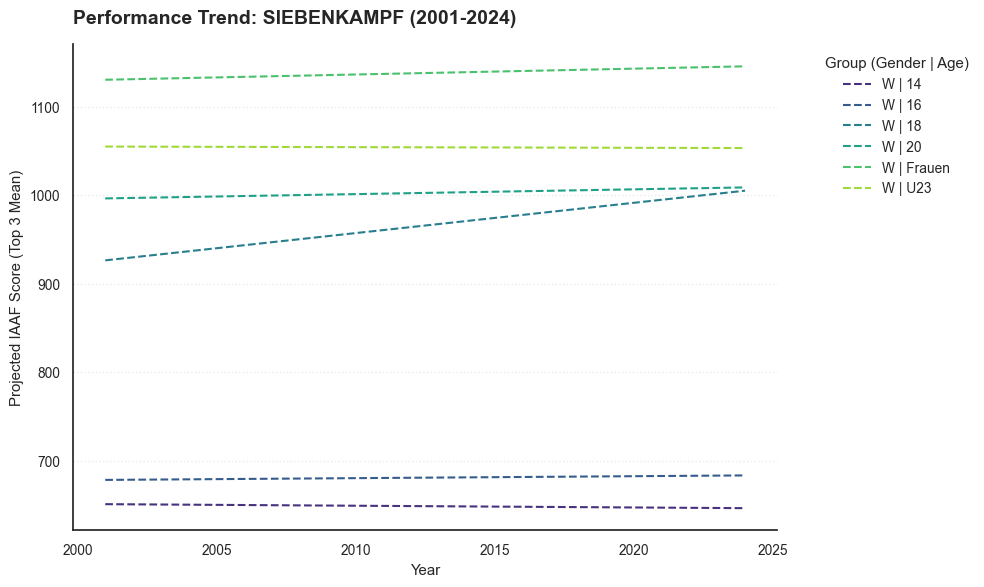

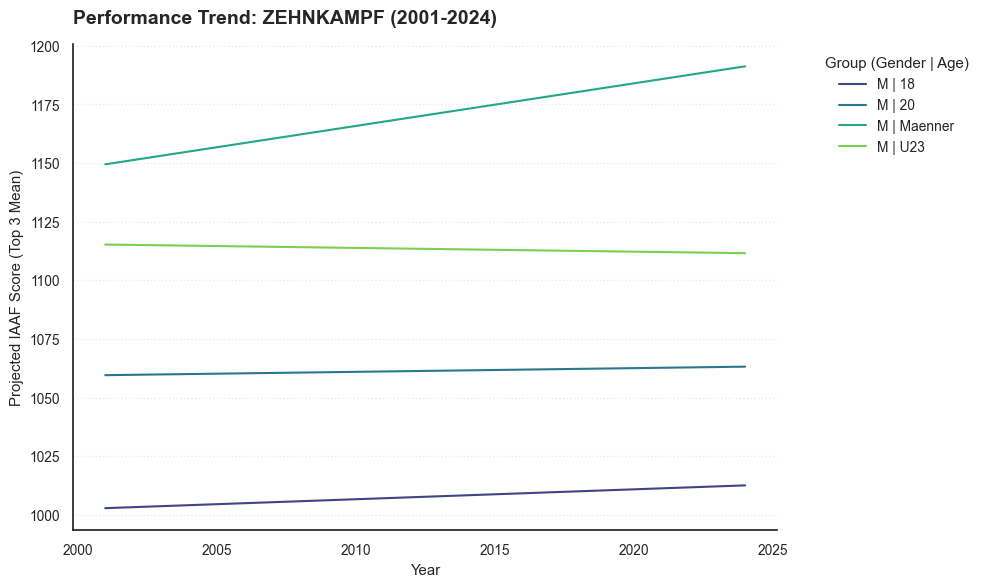

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from util import MEASUREMENT_TYPE

def plot_regression_all_disciplines(df):
    # 1. Datenvorbereitung
    df_reg = df
    df_reg['iaaf_score'] = pd.to_numeric(df_reg['iaaf_score'], errors='coerce')
    df_reg = df_reg.dropna(subset=['iaaf_score'])

    all_disciplines = MEASUREMENT_TYPE['time'] + MEASUREMENT_TYPE['meter'] + MEASUREMENT_TYPE['points']

    # 2. Loop über jede Disziplin
    for disc in all_disciplines:
        data = df_reg[df_reg['disziplin'] == disc]
        if data.empty:
            continue

        # Berechnung der Top 3 Mittelwerte pro Gruppe und Jahr für die Regression
        metrics = data.groupby(['jahr', 'geschlecht', 'altersklasse'])['iaaf_score'].apply(
            lambda x: x.nlargest(3).mean()
        ).reset_index()

        # 3. Plotting: Sleek Regression Design
        plt.figure(figsize=(10, 6))
        sns.set_context("notebook", font_scale=0.9)
        sns.set_style("white")

        # Wir nutzen 'hue' für die Altersklasse und 'style' für das Geschlecht
        # lmplot ist hier ideal, aber für die Kontrolle nutzen wir regplot in einer Schleife
        groups = metrics.groupby(['geschlecht', 'altersklasse'])
        
        # Farbpalette für Altersklassen
        palette = sns.color_palette("viridis", n_colors=metrics['altersklasse'].nunique())
        
        for (name, group), color in zip(groups, palette):
            gender, age = name
            linestyle = '-' if gender == 'M' else '--'
            
            sns.regplot(data=group, x='jahr', y='iaaf_score', 
                        scatter=False, # Nur die Linie, keine Punkte für "sleek" Look
                        label=f"{gender} | {age}", 
                        line_kws={"linestyle": linestyle, "linewidth": 1.5},
                        color=color, ci=None) # ci=None entfernt die Schatten für mehr Klarheit

        # 4. Final Touches
        plt.title(f'Performance Trend: {disc.upper()} (2001-2024)', 
                  fontsize=14, fontweight='bold', loc='left', pad=15)
        plt.xlabel('Year')
        plt.ylabel('Projected IAAF Score (Top 3 Mean)')
        
        # Legende außerhalb platzieren
        plt.legend(title="Group (Gender | Age)", bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)
        
        sns.despine() # Entfernt Rahmen oben und rechts
        plt.grid(axis='y', linestyle=':', alpha=0.4)
        
        plt.tight_layout()
        plt.show()

# Aufruf
plot_regression_all_disciplines(df)

#### Vergleich der Top 12 jeweils in 3er Gruppen

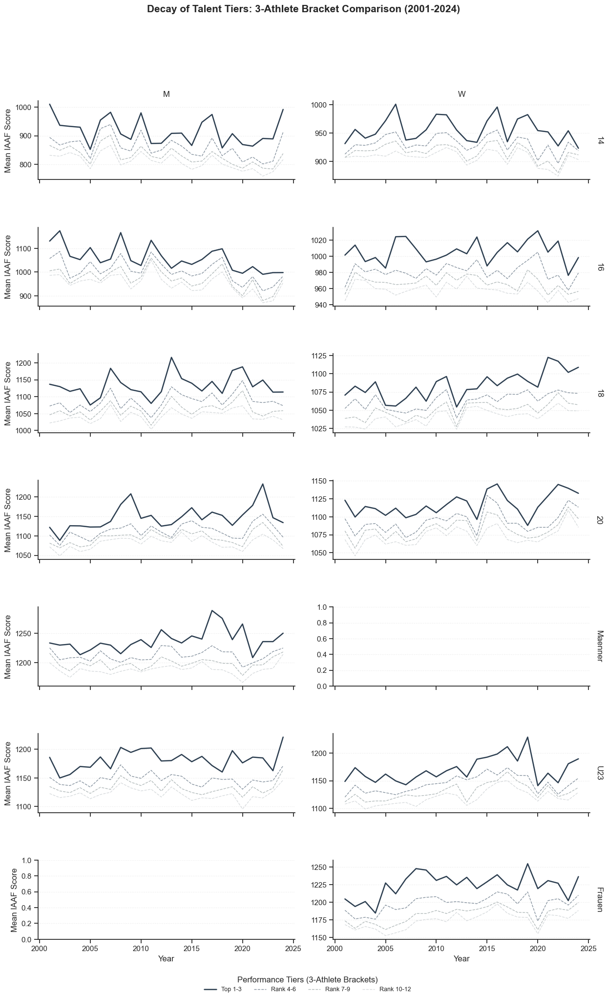

In [19]:
def plot_talent_stepping(df):
    # 1. Datenvorbereitung
    df_analysis = df
    df_analysis['iaaf_score'] = pd.to_numeric(df_analysis['iaaf_score'], errors='coerce')
    df_analysis = df_analysis.dropna(subset=['iaaf_score'])
    
    # Hilfsfunktion für die 3er-Staffelung
    def get_stepping_metrics(group):
        sorted_scores = group['iaaf_score'].sort_values(ascending=False).values
        
        # Wir berechnen Mittelwerte für 3er-Blöcke
        res = {}
        steps = [("Top 1-3", 0, 3), ("Rank 4-6", 3, 6), ("Rank 7-9", 6, 9), ("Rank 10-12", 9, 12)]
        
        for label, start, end in steps:
            block = sorted_scores[start:end]
            res[label] = block.mean() if len(block) > 0 else np.nan
            
        return pd.Series(res)

    # 2. Aggregation
    group_cols = ['jahr', 'geschlecht', 'altersklasse']
    metrics = df_analysis.groupby(group_cols).apply(get_stepping_metrics, include_groups=False).reset_index()

    # 3. Schlankes Design-Setup
    sns.set_theme(style="ticks")
    colors = ["#2c3e50", "#34495e", "#7f8c8d", "#bdc3c7"] # Von Dunkel nach Hell
    
    g = sns.FacetGrid(metrics, col="geschlecht", row="altersklasse", 
                      height=3.5, aspect=1.8, margin_titles=True, sharey=False)

    # Plots für die verschiedenen Stufen
    labels = ["Top 1-3", "Rank 4-6", "Rank 7-9", "Rank 10-12"]
    for i, label in enumerate(labels):
        linestyle = "-" if i == 0 else "--"
        linewidth = 1.8 if i == 0 else 1.0
        alpha = 1.0 if i == 0 else 0.6
        
        g.map(plt.plot, "jahr", label, color=colors[i], 
              linestyle=linestyle, linewidth=linewidth, alpha=alpha, label=label)

    # 4. Final Touches
    g.set_axis_labels("Year", "Mean IAAF Score")
    g.set_titles(row_template="{row_name}", col_template="{col_name}")
    
    # Legende außerhalb unten platziert
    plt.legend(title="Performance Tiers (3-Athlete Brackets)", loc='upper center', 
               bbox_to_anchor=(-0.1, -0.4), ncol=4, frameon=False, fontsize=9)

    for ax in g.axes.flat:
        ax.yaxis.grid(True, linestyle=':', alpha=0.4)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

    plt.subplots_adjust(top=0.9, hspace=0.6, bottom=0.2)
    g.fig.suptitle('Decay of Talent Tiers: 3-Athlete Bracket Comparison (2001-2024)', 
                   fontsize=15, fontweight='bold')
    
    plt.show()

# Aufruf
plot_talent_stepping(df)

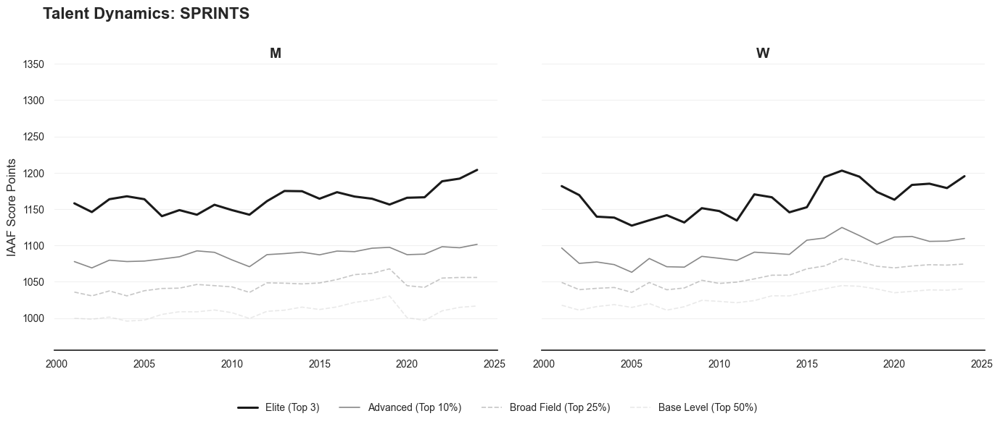

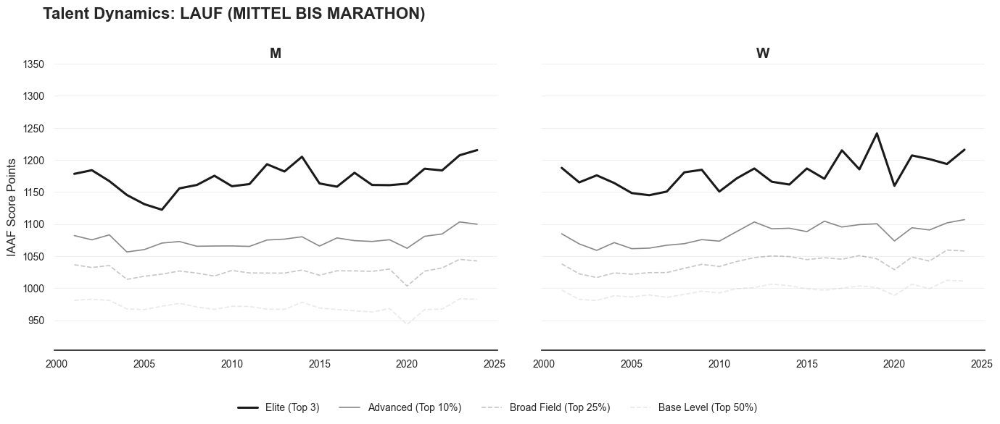

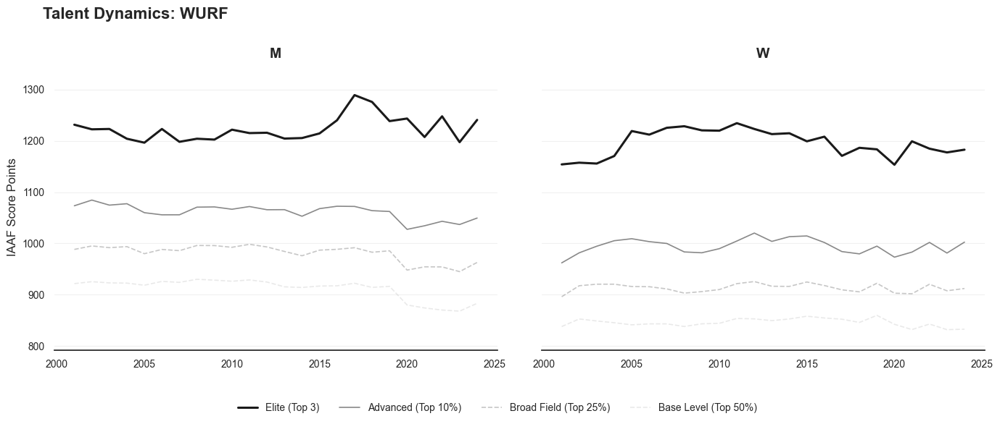

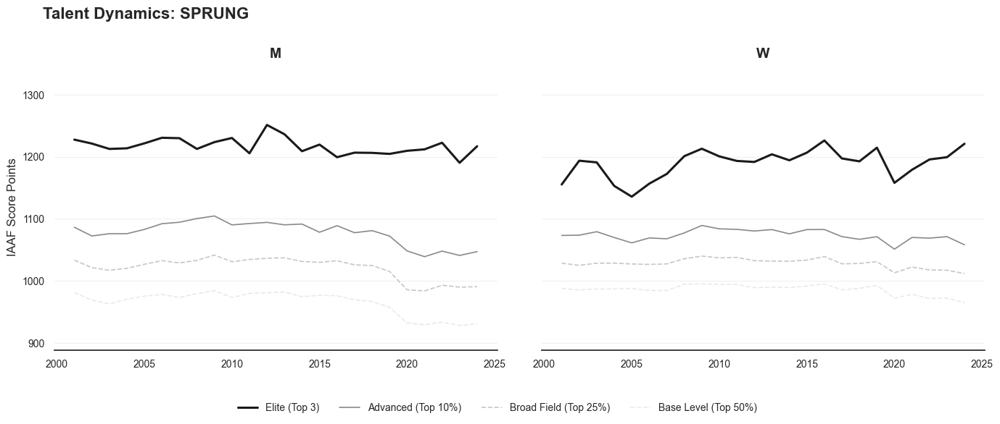

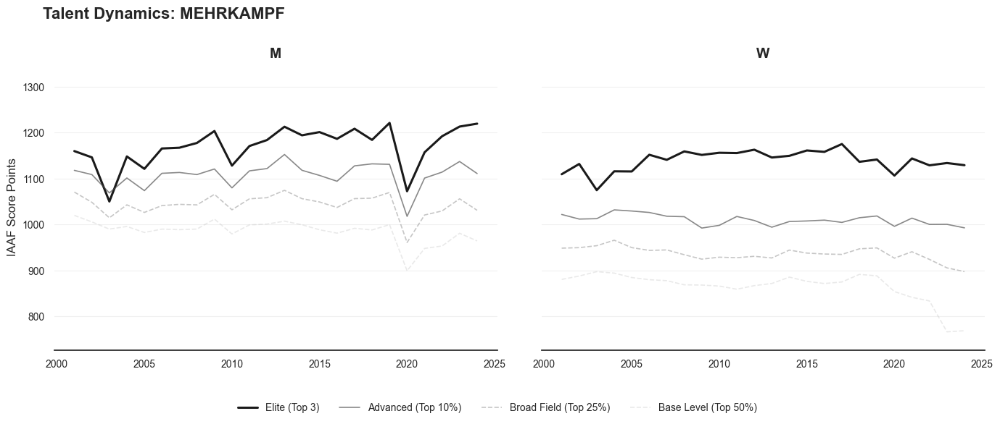

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_sleek_talent_spectra(df):
    # 1. Datenvorbereitung
    df_analysis = df.copy()
    df_analysis['iaaf_score'] = pd.to_numeric(df_analysis['iaaf_score'], errors='coerce')
    df_analysis = df_analysis.dropna(subset=['iaaf_score'])
    
    # 2. Spektren Definition
    spectra = {
        "Sprints": ["100 m", "200 m", "400 m", "100 m Hürden", "110 m Hürden", "400 m Hürden"],
        "Lauf (Mittel bis Marathon)": ["800 m", "1500 m", "3000 m", "5000 m", "10000 m", "3000 m Hindernis", "Marathon"],
        "Wurf": ["Speerwurf", "Diskuswurf", "Kugelstoßen", "Hammerwurf"],
        "Sprung": ["Weitsprung", "Hochsprung", "Stabhochsprung", "Dreisprung"],
        "Mehrkampf": ["Zehnkampf", "Siebenkampf"]
    }

    # 3. Funktion für die Perzentil-Berechnung (Nutzt alle verfügbaren Daten)
    def get_percentile_metrics(group):
        scores = group['iaaf_score'].sort_values(ascending=False).values
        n = len(scores)
        if n < 5: return pd.Series(dtype=float)
        
        return pd.Series({
            "Elite (Top 3)": np.mean(scores[:3]),
            "Advanced (Top 10%)": np.mean(scores[:max(1, int(n*0.1))]),
            "Broad Field (Top 25%)": np.mean(scores[:max(1, int(n*0.25))]),
            "Base Level (Top 50%)": np.mean(scores[:max(1, int(n*0.5))])
        })

    # 4. Design-Setup
    plt.rcParams['font.family'] = 'sans-serif'
    # Elegante, gedeckte Farbskala
    colors = ["#1a1a1a", "#4a4a4a", "#8e8e8e", "#c2c2c2"] 
    
    for spectrum_name, disc_list in spectra.items():
        df_spec = df_analysis[df_analysis['disziplin'].isin(disc_list)]
        if df_spec.empty: continue
            
        metrics = df_spec.groupby(['jahr', 'geschlecht']).apply(get_percentile_metrics, include_groups=False).reset_index()

        # Plot-Erstellung
        g = sns.FacetGrid(metrics, col="geschlecht", height=5, aspect=1.4)
        
        labels = ["Elite (Top 3)", "Advanced (Top 10%)", "Broad Field (Top 25%)", "Base Level (Top 50%)"]
        for i, label in enumerate(labels):
            alpha = 1.0 if i == 0 else 0.8 - (i * 0.15)
            lw = 2.2 if i == 0 else 1.2
            ls = '-' if i < 2 else '--'
            
            g.map(plt.plot, "jahr", label, color=colors[i], linewidth=lw, alpha=alpha, linestyle=ls, label=label)

        # Sleek Styling
        g.set_axis_labels("", "IAAF Score Points")
        g.set_titles("{col_name}", size=14, weight='bold')
        
        for ax in g.axes.flat:
            ax.grid(axis='y', color='#f0f0f0', linestyle='-', linewidth=0.8, zorder=0)
            ax.spines['left'].set_visible(False)
            ax.spines['right'].set_visible(False)
            ax.spines['top'].set_visible(False)
            ax.tick_params(axis='both', which='major', labelsize=10, color='#ffffff')
            
            # Dynamische Y-Achse für mehr "Atemraum"
            ymin = metrics[labels].min().min()
            ax.set_ylim(ymin - 40, 1350) 

        # Titel und Legende
        g.fig.suptitle(f'Talent Dynamics: {spectrum_name.upper()}', fontsize=16, weight='black', x=0.05, ha='left', y=1.08)
        plt.legend(frameon=False, loc='lower center', bbox_to_anchor=(-0.1, -0.25), ncol=4, fontsize=10)
        
        plt.subplots_adjust(hspace=0.4, wspace=0.1)
        plt.show()

# Ausführung
plot_sleek_talent_spectra(df)

#### Vergleich der Top 9 jeweils in 3er Gruppen pro Disziplin, Alter, Geschlecht (vollständig)

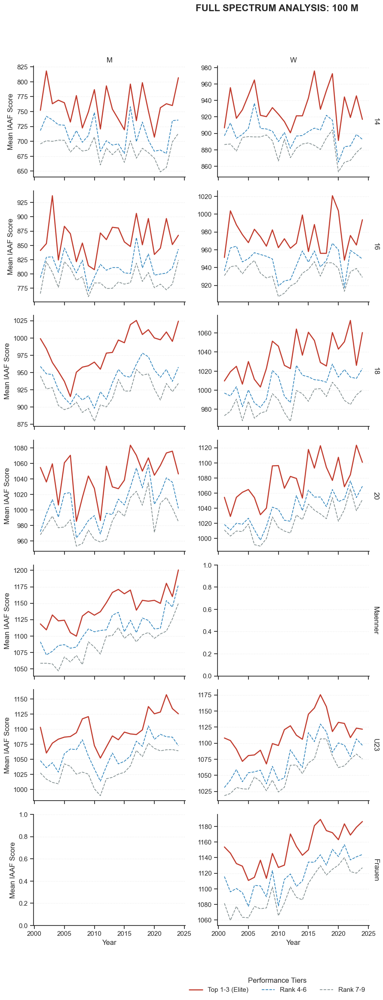

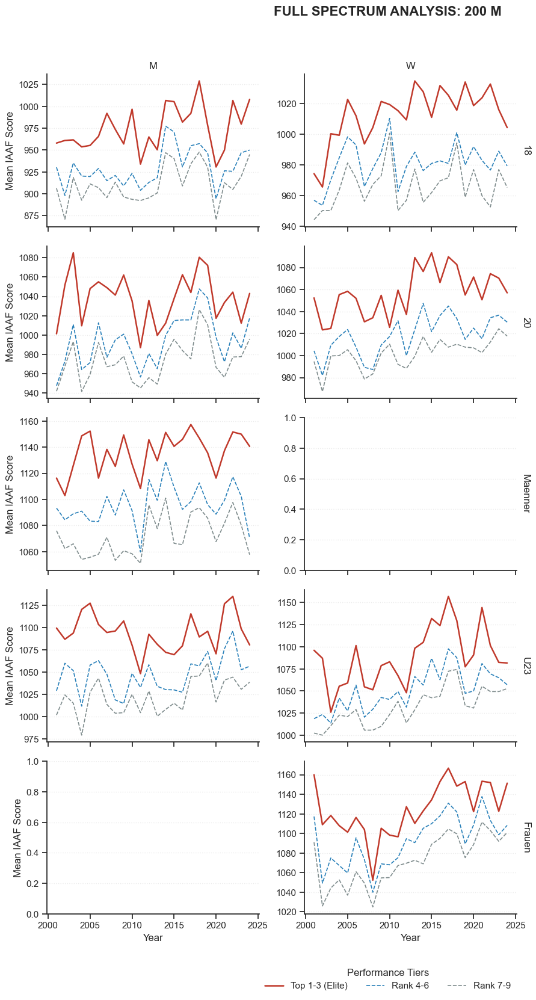

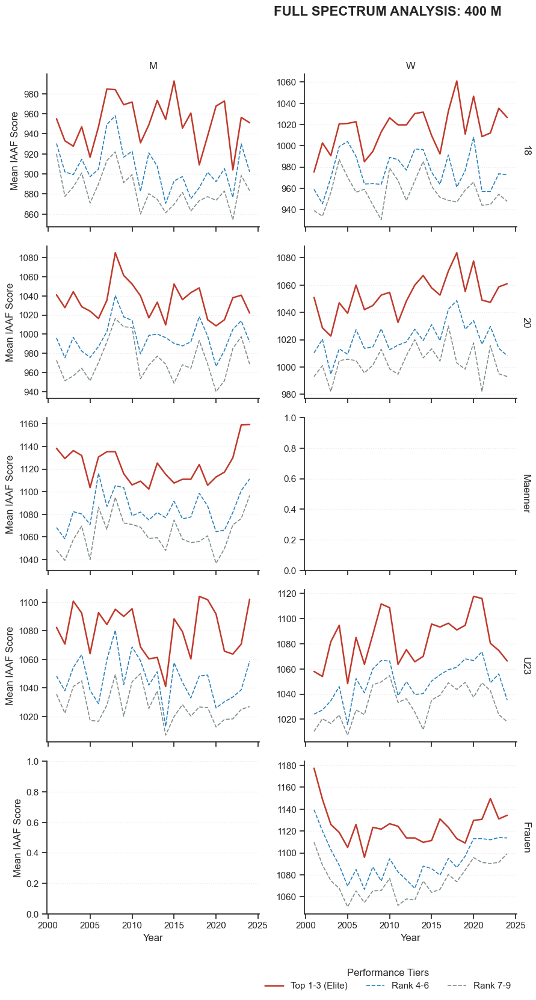

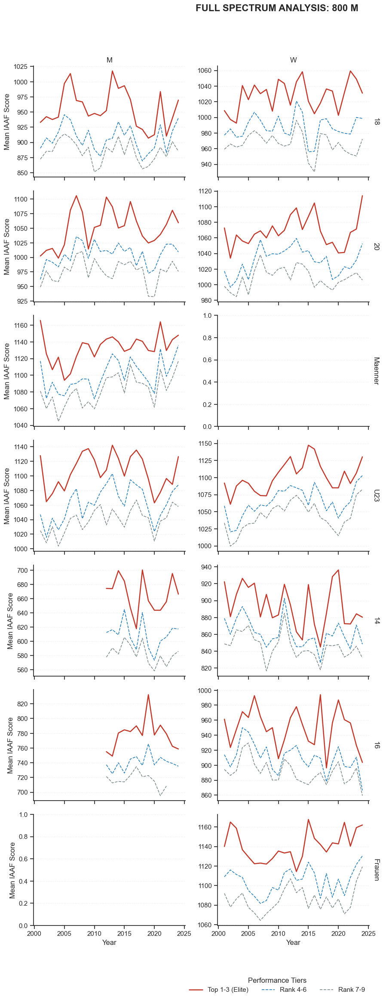

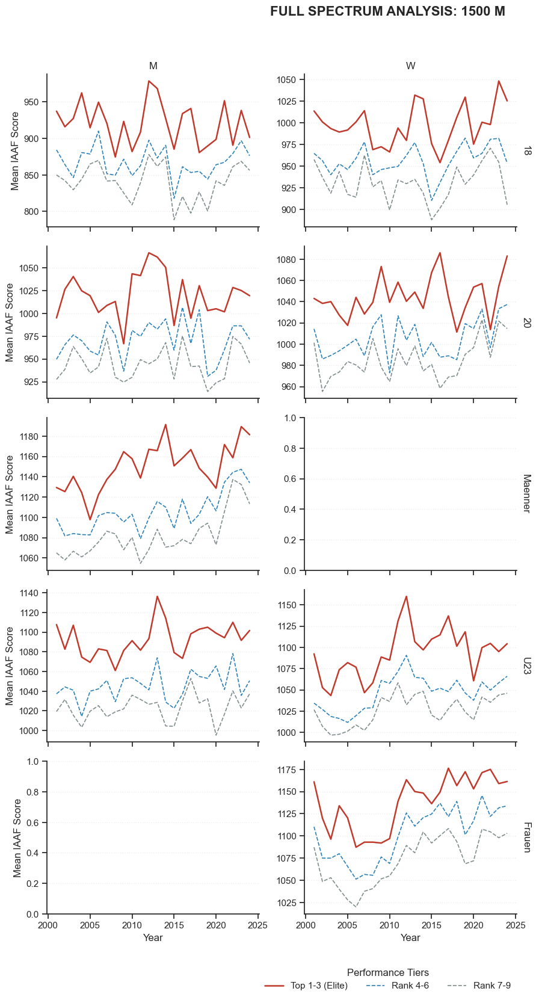

...

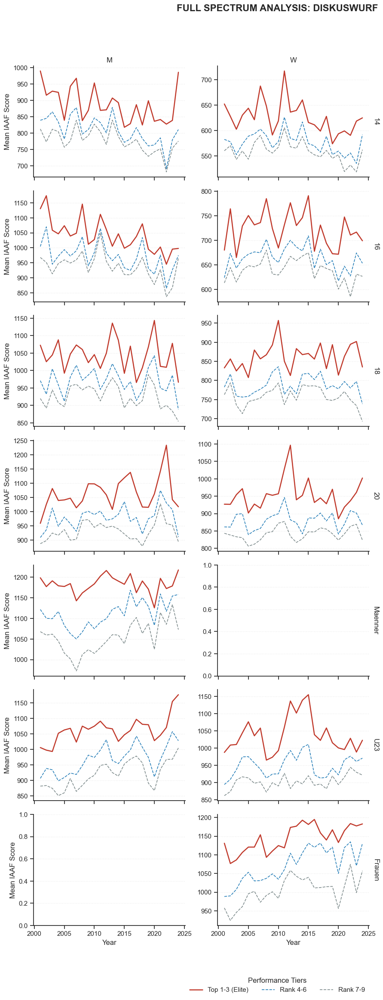

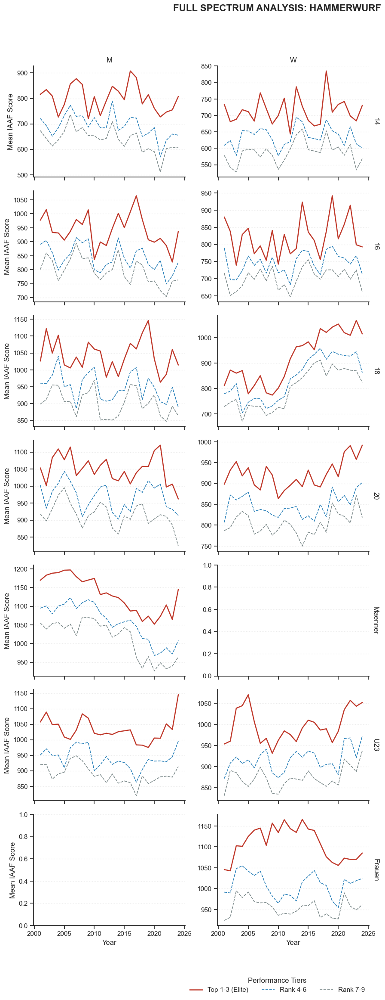

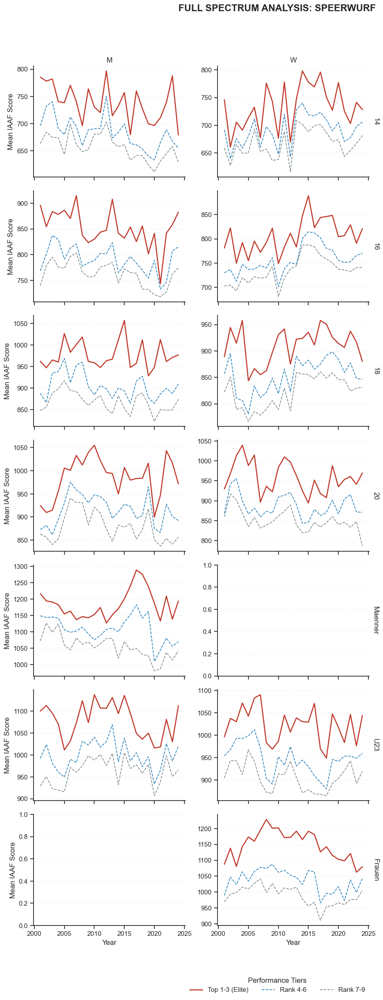

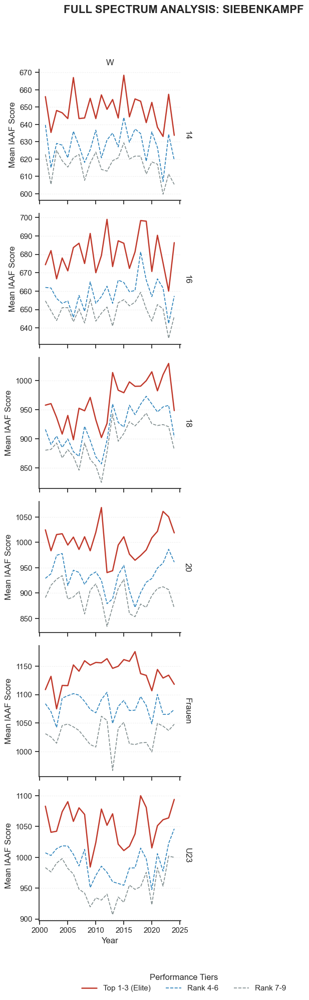

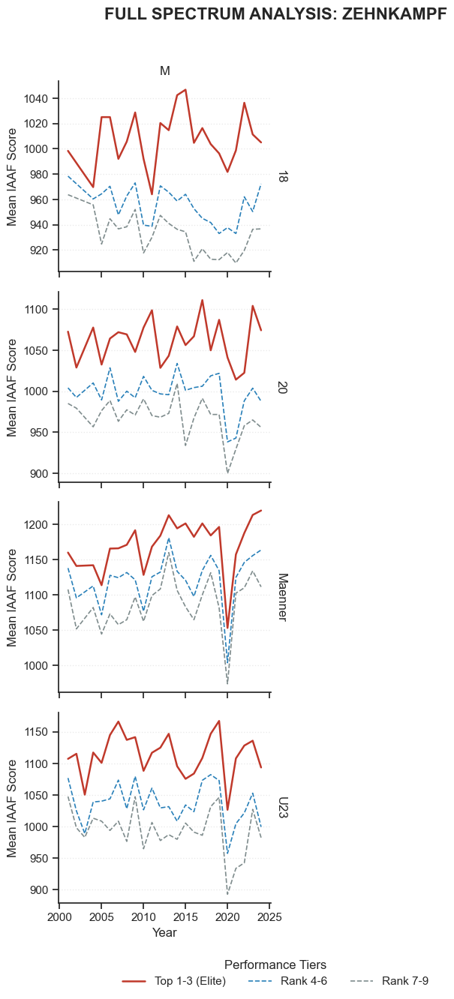

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from util import MEASUREMENT_TYPE  # Wir nutzen deine Definitionen direkt

def plot_all_disciplines_comprehensive(df):
    # 1. Vorbereitung & Bereinigung
    df_analysis = df[df['jahr'] >= 2001].copy()
    df_analysis['iaaf_score'] = pd.to_numeric(df_analysis['iaaf_score'], errors='coerce')
    df_analysis = df_analysis.dropna(subset=['iaaf_score'])
    
    # 2. Alle Disziplinen aus der util.py sammeln
    all_disciplines = (
        MEASUREMENT_TYPE['time'] + 
        MEASUREMENT_TYPE['meter'] + 
        MEASUREMENT_TYPE['points']
    )
    
    # Hilfsfunktion für die 3er-Staffelung
    def get_stepping_metrics(group):
        sorted_scores = group['iaaf_score'].sort_values(ascending=False).values
        res = {}
        # Wir definieren 3 klare Leistungsklassen
        steps = [("Top 1-3 (Elite)", 0, 3), ("Rank 4-6", 3, 6), ("Rank 7-9", 6, 9)]
        for label, start, end in steps:
            block = sorted_scores[start:end]
            res[label] = block.mean() if len(block) > 0 else np.nan
        return pd.Series(res)

    # 3. Automatisierter Loop über JEDE Disziplin
    for disc in all_disciplines:
        # Daten für diese Disziplin filtern
        disc_data = df_analysis[df_analysis['disziplin'] == disc]
        
        # Überspringen, falls keine Daten vorhanden sind (z.B. 100km Lauf in Jugendklassen)
        if disc_data.empty:
            continue
            
        # Metriken berechnen
        metrics = disc_data.groupby(['jahr', 'geschlecht', 'altersklasse']).apply(
            get_split_metrics_local, include_groups=False
        ).reset_index()

        # Plot-Konfiguration (schlankes Design)
        sns.set_theme(style="ticks")
        g = sns.FacetGrid(metrics, col="geschlecht", row="altersklasse", 
                          height=3, aspect=1.6, margin_titles=True, sharey=False)

        colors = ["#c0392b", "#2980b9", "#7f8c8d"] # Elite (Rot), Mid (Blau), Base (Grau)
        labels = ["Top 1-3 (Elite)", "Rank 4-6", "Rank 7-9"]

        for i, label in enumerate(labels):
            g.map(plt.plot, "jahr", label, color=colors[i], 
                  linewidth=1.8 if i==0 else 1.2, 
                  linestyle="-" if i==0 else "--", label=label)

        # Beschriftungen & Titel
        g.set_axis_labels("Year", "Mean IAAF Score")
        g.set_titles(row_template="{row_name}", col_template="{col_name}")
        g.fig.suptitle(f'FULL SPECTRUM ANALYSIS: {disc.upper()}', 
                       fontsize=16, fontweight='bold', y=1.05)
        
        # Legende unter den Plot setzen
        g.add_legend(title="Performance Tiers", loc="lower center", bbox_to_anchor=(0.5, -0.05), ncol=3)
        
        for ax in g.axes.flat:
            ax.yaxis.grid(True, linestyle=':', alpha=0.4)
            
        plt.show()

# Interne Hilfsfunktion (muss im Scope sein)
def get_split_metrics_local(group):
    sorted_scores = group['iaaf_score'].sort_values(ascending=False).values
    return pd.Series({
        "Top 1-3 (Elite)": sorted_scores[0:3].mean() if len(sorted_scores) > 0 else np.nan,
        "Rank 4-6": sorted_scores[3:6].mean() if len(sorted_scores) > 3 else np.nan,
        "Rank 7-9": sorted_scores[6:9].mean() if len(sorted_scores) > 6 else np.nan
    })

# Startet die komplette Analyse für alle Disziplinen
plot_all_disciplines_comprehensive(df)

#### Einfluss von Top 3-Athleten in jeweiliger Disziplin (Differenz zwischen Avg der Top 3 und Avg des Restes)

C:\Users\erikh\AppData\Local\Temp\ipykernel_26384\593609312.py:27: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ).apply(calculate_influence).reset_index()


<Figure size 1400x800 with 0 Axes>

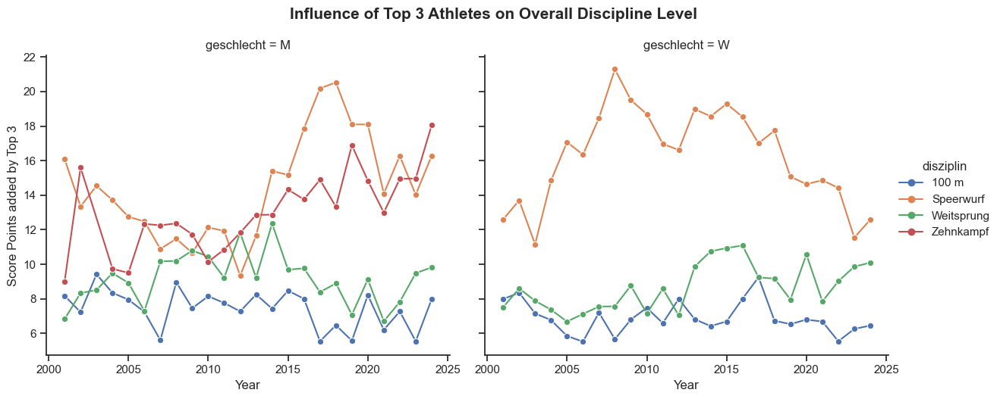

In [26]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def analyze_star_impact(df):
    # 1. Datenvorbereitung
    df_impact = df[df['jahr'] >= 2001].copy()
    df_impact['iaaf_score'] = pd.to_numeric(df_impact['iaaf_score'], errors='coerce')
    
    # 2. Berechnung des Einflusses
    def calculate_influence(group):
        all_mean = group['iaaf_score'].mean()
        # Wir entfernen die Top 3, um das "Basis-Niveau" zu sehen
        field_only_mean = group['iaaf_score'].sort_values(ascending=False).iloc[3:].mean()
        
        # Der Impact ist die Differenz in Score-Punkten
        impact_abs = all_mean - field_only_mean
        # Relativer Impact in Prozent
        impact_rel = (impact_abs / field_only_mean) * 100 if field_only_mean > 0 else 0
        
        return pd.Series({'Global_Mean': all_mean, 'Field_Mean': field_only_mean, 
                          'Star_Impact_Points': impact_abs, 'Star_Impact_Pct': impact_rel})

    # Gruppierung nach Jahr und Disziplin (fokussiert auf Maenner/Frauen für klare Trends)
    impact_stats = df_impact[df_impact['altersklasse'].isin(['Maenner', 'Frauen'])].groupby(
        ['jahr', 'disziplin', 'geschlecht'], observed=False
    ).apply(calculate_influence).reset_index()

    # 3. Visualisierung: Der "Star-Schatten" über die Zeit
    # Wir plotten den Star_Impact_Points. Je höher der Wert, desto abhängiger die Disziplin.
    plt.figure(figsize=(14, 8))
    sns.set_style("ticks")
    
    # Beispielhaft für Top-Disziplinen
    top_discs = ['100 m', 'Speerwurf', 'Weitsprung', 'Zehnkampf']
    plot_data = impact_stats[impact_stats['disziplin'].isin(top_discs)]
    
    g = sns.relplot(data=plot_data, x='jahr', y='Star_Impact_Points', hue='disziplin', 
                    col='geschlecht', kind='line', marker='o', height=5, aspect=1.2)

    g.fig.suptitle('Influence of Top 3 Athletes on Overall Discipline Level', fontsize=15, fontweight='bold', y=1.05)
    g.set_axis_labels("Year", "Score Points added by Top 3")
    
    plt.show()

    return impact_stats

# Ausführung
impact_results = analyze_star_impact(df)

C:\Users\erikh\AppData\Local\Temp\ipykernel_26384\2562519321.py:24: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ).apply(calculate_influence).reset_index()


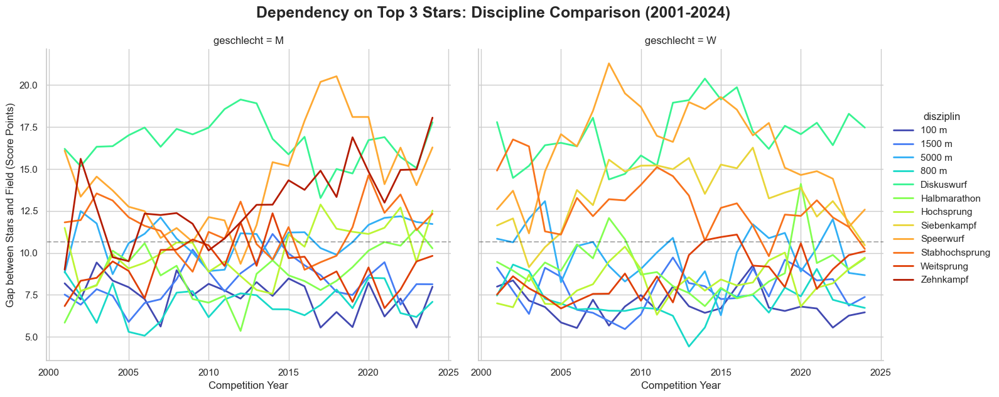

In [51]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def analyze_star_impact_expanded(df):
    # 1. Datenvorbereitung
    df_impact = df[df['jahr'] >= 2001].copy()
    df_impact['iaaf_score'] = pd.to_numeric(df_impact['iaaf_score'], errors='coerce')
    df_impact = df_impact.dropna(subset=['iaaf_score'])
    
    def calculate_influence(group):
        if len(group) < 5: # Sicherheitscheck für kleine Datensätze
            return pd.Series({'Star_Impact_Points': np.nan})
        
        all_mean = group['iaaf_score'].mean()
        # Basis-Niveau ohne die Top 3
        field_only_mean = group['iaaf_score'].sort_values(ascending=False).iloc[3:].mean()
        impact_abs = all_mean - field_only_mean
        return pd.Series({'Star_Impact_Points': impact_abs})

    # Berechnung für alle Disziplinen
    impact_stats = df_impact[df_impact['altersklasse'].isin(['Maenner', 'Frauen'])].groupby(
        ['jahr', 'disziplin', 'geschlecht'], observed=False
    ).apply(calculate_influence).reset_index()

    # 2. Auswahl eines breiten Spektrums an Disziplinen
    relevant_discs = [
        # Sprint & Hürden
        '100 m', '110 m Hürden', '100 m Hürden',
        # Lauf
        '800 m', '1500 m', '5000 m', 'Halbmarathon',
        # Sprung
        'Weitsprung', 'Hochsprung', 'Stabhochsprung',
        # Wurf
        'Speerwurf', 'Diskuswurf', 'Kugelstoßen',
        # Mehrkampf
        'Zehnkampf', 'Siebenkampf'
    ]
    
    plot_data = impact_stats[impact_stats['disziplin'].isin(relevant_discs)]

    # 3. Visualisierung mit FacetGrid für bessere Übersicht
    sns.set_style("whitegrid")
    g = sns.relplot(
        data=plot_data, 
        x='jahr', 
        y='Star_Impact_Points', 
        hue='disziplin', 
        col='geschlecht', 
        kind='line', 
        palette='turbo', # Farbenfroh bei vielen Disziplinen
        linewidth=2,
        height=6, 
        aspect=1.2,
        facet_kws={'sharey': True}
    )

    # Optik-Tuning
    g.fig.suptitle('Dependency on Top 3 Stars: Discipline Comparison (2001-2024)', 
                   fontsize=18, fontweight='bold', y=1.05)
    g.set_axis_labels("Competition Year", "Gap between Stars and Field (Score Points)")
    
    # Horizontale Linie zur Orientierung (Durchschnittlicher Impact)
    for ax in g.axes.flat:
        ax.axhline(plot_data['Star_Impact_Points'].mean(), color='black', linestyle='--', alpha=0.3, label='Average Impact')

    plt.show()
    return impact_stats

# Ausführung
impact_results = analyze_star_impact_expanded(df)

#### Glentt Plot der 50 dominantesten Athleten

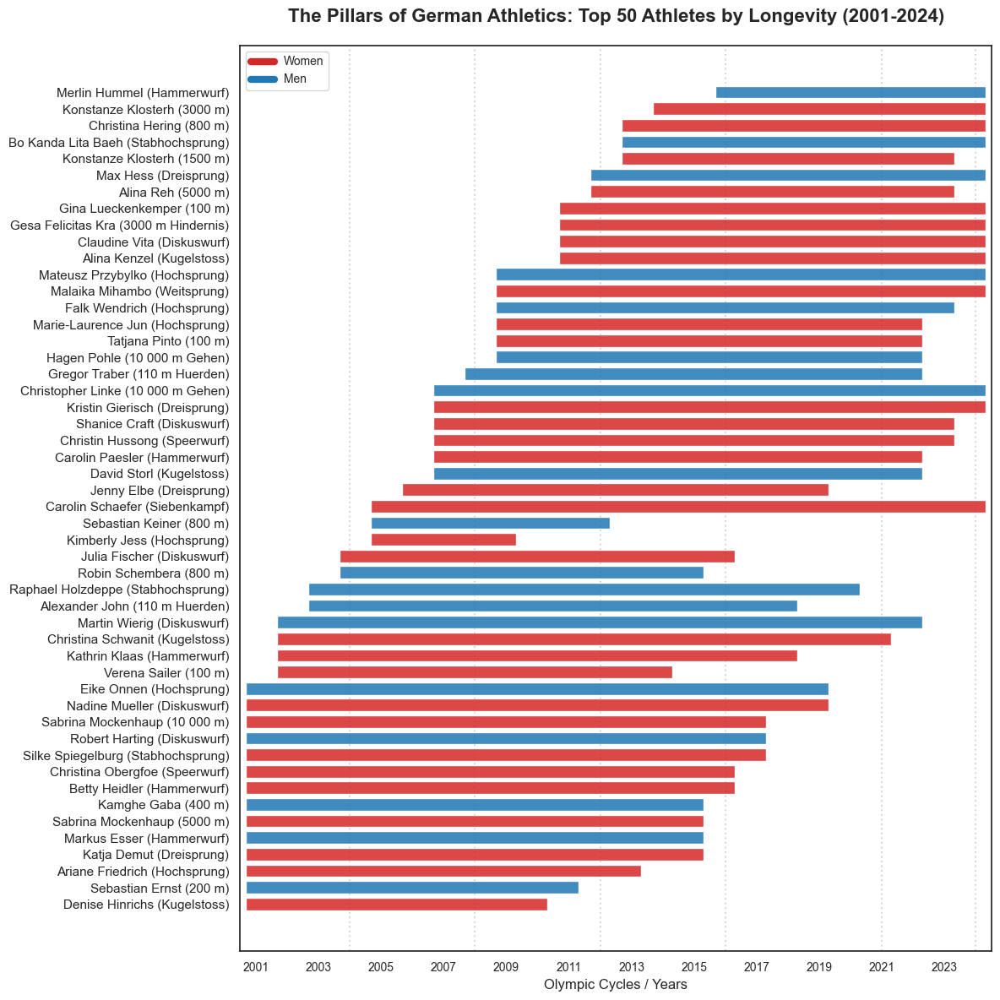

In [40]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_compact_career_gantt(df, top_n=50):
    # 1. Datenvorbereitung
    df_dom = df[df['jahr'] >= 2001].copy()
    df_dom['iaaf_score'] = pd.to_numeric(df_dom['iaaf_score'], errors='coerce')
    
    # Filter auf Top 3
    top_3 = df_dom.sort_values(['jahr', 'disziplin', 'iaaf_score'], ascending=[True, True, False])
    top_3 = top_3.groupby(['jahr', 'disziplin', 'geschlecht', 'altersklasse']).head(3)

    # 2. Karriere-Statistiken
    career = top_3.groupby(['name', 'geschlecht', 'disziplin']).agg(
        start=('jahr', 'min'),
        end=('jahr', 'max'),
        years=('jahr', 'count'),
        avg_score=('iaaf_score', 'mean')
    ).reset_index()

    # Auswahl der Top N nach Beständigkeit (Jahre in Top 3)
    # Bei Gleichstand entscheidet der avg_score
    top_athletes = career.sort_values(by=['years', 'avg_score'], ascending=[False, False]).head(top_n)
    
    # Sortierung für optischen Fluss: Erst nach Startjahr, dann nach Endjahr
    top_athletes = top_athletes.sort_values(by=['start', 'end'], ascending=[True, True])

    # 3. Plotting
    plt.figure(figsize=(12, 12)) # Höherer Plot für mehr Athleten
    sns.set_style("white")

    # Farbschema: Frauen Rot, Männer Blau
    colors = {'M': '#1f77b4', 'W': '#d62728'} 
    
    for i, row in enumerate(top_athletes.itertuples()):
        plt.barh(y=f"{row.name[:18]} ({row.disziplin})", 
                 width=row.end - row.start + 0.6, 
                 left=row.start - 0.3, 
                 color=colors[row.geschlecht], 
                 alpha=0.85,
                 edgecolor='white',
                 linewidth=0.3,
                 height=0.7) # Kompakter durch geringere Höhe

    # 4. Design & Annotationen
    plt.title(f'The Pillars of German Athletics: Top {top_n} Athletes by Longevity (2001-2024)', 
              fontsize=16, fontweight='bold', pad=20)
    plt.xlabel('Olympic Cycles / Years', fontsize=12)
    plt.xticks(range(2001, 2026, 2), fontsize=10)
    plt.xlim(2000.5, 2024.5)
    
    # Vertikale Linien für Olympia-Jahre (als Kontext für "Spitzenleistung")
    for olympic_year in [2004, 2008, 2012, 2016, 2021, 2024]:
        plt.axvline(olympic_year, color='gray', linestyle=':', alpha=0.3, zorder=0)

    # Legende
    from matplotlib.lines import Line2D
    legend_elements = [Line2D([0], [0], color='#d62728', lw=6, label='Women'),
                       Line2D([0], [0], color='#1f77b4', lw=6, label='Men')]
    plt.legend(handles=legend_elements, loc='upper left', frameon=True, fontsize=10)

    plt.tight_layout()
    plt.show()

# Ausführung
plot_compact_career_gantt(df, top_n=50)
 


#### Was passiert, nachdem ein dominanter Athlet retired?

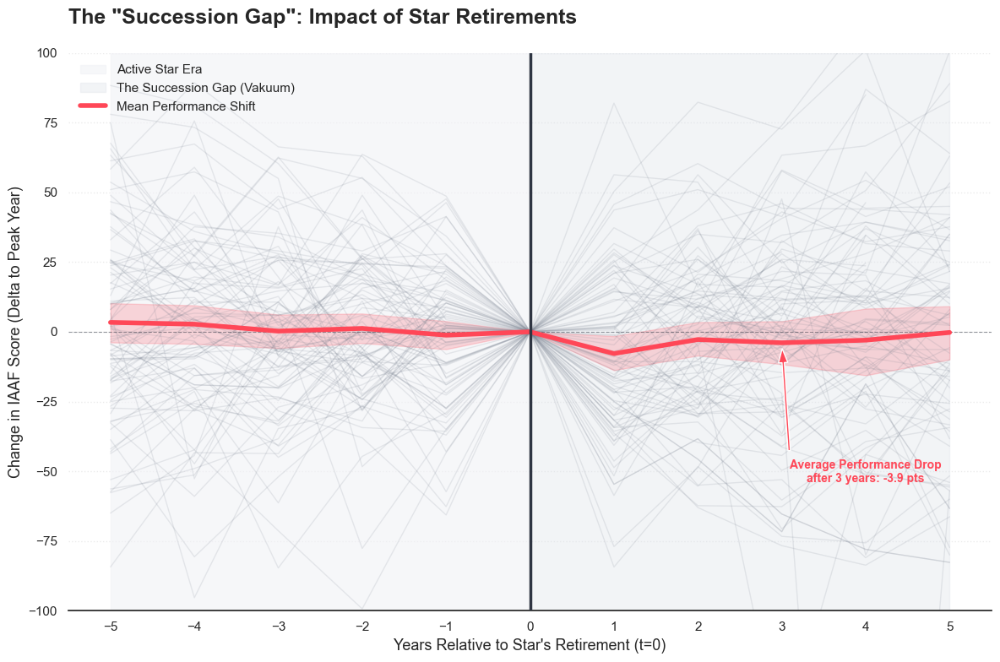

In [44]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_succession_gap_analysis_fixed(df, min_longevity=6):
    # 1. Datenvorbereitung
    df_ana = df.copy()
    df_ana['iaaf_score'] = pd.to_numeric(df_ana['iaaf_score'], errors='coerce')
    df_ana = df_ana.dropna(subset=['iaaf_score'])
    
    # Identifiziere Top 3 Leistungen pro Gruppe
    top_3 = df_ana.sort_values(['jahr', 'disziplin', 'geschlecht', 'altersklasse', 'iaaf_score'], 
                               ascending=[True, True, True, True, False])
    top_3 = top_3.groupby(['jahr', 'disziplin', 'geschlecht', 'altersklasse']).head(3)

    # 2. Identifikation der "Säulen" (Stars)
    # Wir filtern auf Erwachsene, die zwischen 2008 und 2021 aufgehört haben
    careers = top_3[top_3['altersklasse'].isin(['Maenner', 'Frauen'])].groupby(['name', 'disziplin', 'geschlecht']).agg(
        start=('jahr', 'min'),
        end=('jahr', 'max'),
        years=('jahr', 'count')
    ).reset_index()

    stars = careers[(careers['years'] >= min_longevity) & (careers['end'] <= 2021) & (careers['end'] >= 2008)]
    
    # 3. Zeitreihen um das Karriereende normalisieren (Event Study)
    all_trajectories = []
    
    # Referenzwerte: Jährlicher Durchschnitt der Top 3 pro Disziplin/Geschlecht
    discipline_averages = top_3[top_3['altersklasse'].isin(['Maenner', 'Frauen'])].groupby(
        ['jahr', 'disziplin', 'geschlecht']
    )['iaaf_score'].mean().reset_index()

    for i, (_, star) in enumerate(stars.iterrows()):
        mask = (discipline_averages['disziplin'] == star['disziplin']) & \
               (discipline_averages['geschlecht'] == star['geschlecht'])
        
        yearly_avg = discipline_averages[mask].copy()
        yearly_avg['rel_year'] = yearly_avg['jahr'] - star['end']
        
        # Fenster von -5 bis +5 Jahre um das Karriereende
        window = yearly_avg[(yearly_avg['rel_year'] >= -5) & (yearly_avg['rel_year'] <= 5)].copy()
        
        if 0 in window['rel_year'].values:
            base_score = window[window['rel_year'] == 0]['iaaf_score'].values[0]
            window['score_delta'] = window['iaaf_score'] - base_score
            # WICHTIG: Hier weisen wir die ID direkt im DataFrame zu (Fix für den Fehler)
            window['star_id'] = i  
            all_trajectories.append(window)

    if not all_trajectories:
        print("Keine passenden Athleten gefunden.")
        return

    event_data = pd.concat(all_trajectories)

    # 4. Innovatives Plotting
    plt.figure(figsize=(12, 8))
    sns.set_style("white")

    # Hintergrund-Bereiche zur Orientierung
    plt.axvspan(-5, 0, color='#f1f2f6', alpha=0.6, label='Active Star Era')
    plt.axvspan(0, 5, color='#dfe4ea', alpha=0.4, label='The Succession Gap (Vakuum)')
    
    # Individuelle Linien (dezent im Hintergrund)
    # Nutze 'star_id' für den 'units' Parameter
    sns.lineplot(data=event_data, x='rel_year', y='score_delta', units='star_id', 
                 estimator=None, color='#747d8c', alpha=0.15, linewidth=1, zorder=2)

    # Der aggregierte Trend (Die "Absturz-Kurve")
    sns.lineplot(data=event_data, x='rel_year', y='score_delta', 
                 color='#ff4757', linewidth=4, label='Mean Performance Shift', zorder=3)

    # Design-Details
    plt.axvline(0, color='#2f3542', linewidth=2.5, linestyle='-', zorder=4)
    plt.axhline(0, color='#2f3542', linewidth=0.8, linestyle='--', alpha=0.5)
    
    plt.title('The "Succession Gap": Impact of Star Retirements', 
              fontsize=18, fontweight='bold', loc='left', pad=25)
    plt.xlabel('Years Relative to Star\'s Retirement (t=0)', fontsize=13)
    plt.ylabel('Change in IAAF Score (Delta to Peak Year)', fontsize=13)
    
    # Statistischer Hinweis im Plot
    avg_drop = event_data[event_data['rel_year'] == 3]['score_delta'].mean()
    plt.annotate(f'Average Performance Drop\nafter 3 years: {avg_drop:.1f} pts', 
                 xy=(3, avg_drop), xytext=(4, avg_drop - 50),
                 arrowprops=dict(facecolor='#ff4757', shrink=0.05, width=2, headwidth=8),
                 fontsize=10, fontweight='bold', color='#ff4757', ha='center')

    plt.xticks(range(-5, 6))
    sns.despine(left=True)
    plt.ylim(-100, 100)
    plt.grid(axis='y', linestyle=':', alpha=0.4)
    plt.legend(frameon=False, loc='upper left')
    plt.tight_layout()
    plt.show()

# Aufruf
plot_succession_gap_analysis_fixed(df)

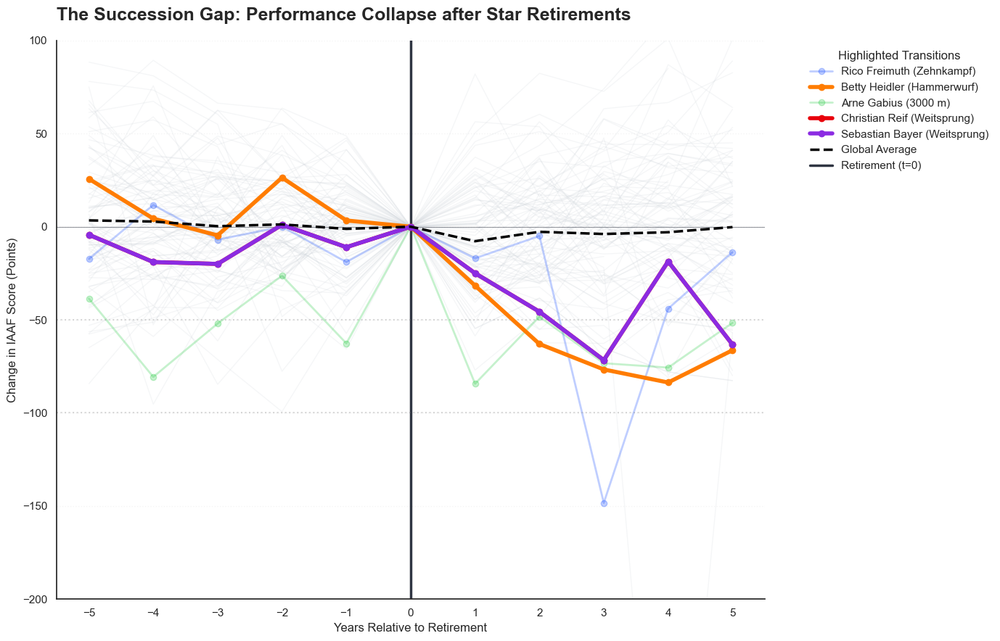

In [48]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_succession_gap_final(df, min_longevity=6):
    # 1. Datenvorbereitung
    df_ana = df.copy()
    df_ana['iaaf_score'] = pd.to_numeric(df_ana['iaaf_score'], errors='coerce')
    df_ana = df_ana.dropna(subset=['iaaf_score'])
    
    # Identifiziere Top 3 Leistungen pro Gruppe
    top_3 = df_ana.sort_values(['jahr', 'disziplin', 'iaaf_score'], ascending=[True, True, False])
    top_3 = top_3.groupby(['jahr', 'disziplin', 'geschlecht', 'altersklasse']).head(3)

    # 2. Stars identifizieren (Dominanz & Karriereende im Beobachtungsfenster)
    careers = top_3[top_3['altersklasse'].isin(['Maenner', 'Frauen'])].groupby(['name', 'disziplin', 'geschlecht']).agg(
        end=('jahr', 'max'), 
        years=('jahr', 'count')
    ).reset_index()
    
    # Filter für langlebige Athleten, die zwischen 2008 und 2021 aufgehört haben
    stars = careers[(careers['years'] >= min_longevity) & (careers['end'].between(2008, 2021))]
    
    # 3. Trajektorien berechnen (Normalisierung auf t=0)
    all_trajectories = []
    discipline_averages = top_3[top_3['altersklasse'].isin(['Maenner', 'Frauen'])].groupby(['jahr', 'disziplin', 'geschlecht'])['iaaf_score'].mean().reset_index()

    for _, star in stars.iterrows():
        mask = (discipline_averages['disziplin'] == star['disziplin']) & (discipline_averages['geschlecht'] == star['geschlecht'])
        window = discipline_averages[mask].copy()
        window['rel_year'] = window['jahr'] - star['end']
        window = window[window['rel_year'].between(-5, 5)]
        
        if 0 in window['rel_year'].values:
            base_score = window[window['rel_year'] == 0]['iaaf_score'].values[0]
            window['score_delta'] = window['iaaf_score'] - base_score
            window['label'] = f"{star['name']} ({star['disziplin']})"
            all_trajectories.append(window)

    event_data = pd.concat(all_trajectories)

    # 4. Die "Crash-Könige" finden (Größter Drop bei t=3)
    crashes = event_data[event_data['rel_year'] == 3].sort_values('score_delta').head(5)
    highlight_labels = crashes['label'].unique()

    # 5. Plotting
    plt.figure(figsize=(14, 9))
    sns.set_style("white")

    # Hintergrund: Alle anderen Graphen (dezent grau)
    for label in event_data['label'].unique():
        if label not in highlight_labels:
            subset = event_data[event_data['label'] == label]
            plt.plot(subset['rel_year'], subset['score_delta'], color='#ced4da', alpha=0.2, linewidth=1, zorder=1)

    # Highlights: Die drastischsten Einbrüche farbig markieren
    palette = sns.color_palette("bright", len(highlight_labels))
    
    for i, label in enumerate(highlight_labels):
        subset = event_data[event_data['label'] == label]
        
        # ALPHA-REDUZIERUNG für spezifische Athleten
        # Wir prüfen, ob die Namen im Label-String vorkommen
        is_transparent = any(name in label for name in ["Arne Gabius", "Rico Freimuth"])
        current_alpha = 0.25 if is_transparent else 1.0
        current_linewidth = 2 if is_transparent else 4
        
        plt.plot(subset['rel_year'], subset['score_delta'], 
                 label=label, 
                 color=palette[i], 
                 linewidth=current_linewidth, 
                 marker='o', 
                 markersize=6, 
                 zorder=3 if not is_transparent else 2, 
                 alpha=current_alpha)

    # Durchschnittslinie (schwarz gestrichelt) über alle Disziplinen
    mean_curve = event_data.groupby('rel_year')['score_delta'].mean()
    plt.plot(mean_curve.index, mean_curve.values, color='black', linestyle='--', linewidth=2.5, label='Global Average', zorder=4)

    # Achsen-Design und Beschriftung
    plt.axvline(0, color='#2f3542', linewidth=2.5, label='Retirement (t=0)')
    plt.axhline(0, color='#2f3542', linewidth=0.8, alpha=0.5)
    
    # Horizontale Hilfslinien für bessere Lesbarkeit des "Drops"
    plt.axhline(-50, color='gray', linestyle=':', alpha=0.3)
    plt.axhline(-100, color='gray', linestyle=':', alpha=0.3)

    plt.title('The Succession Gap: Performance Collapse after Star Retirements', fontsize=18, fontweight='bold', loc='left', pad=20)
    plt.xlabel('Years Relative to Retirement', fontsize=12)
    plt.ylabel('Change in IAAF Score (Points)', fontsize=12)
    
    # Y-Achse auf den gewünschten Bereich einschränken
    plt.ylim(-200, 100)
    plt.xticks(range(-5, 6))

    # Legende außerhalb des Plots platzieren
    plt.legend(title="Highlighted Transitions", bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)
    
    sns.despine()
    plt.grid(axis='y', linestyle=':', alpha=0.2)
    plt.tight_layout()
    plt.show()

# Aufruf der Funktion
plot_succession_gap_final(df)

#### Clubs in den Top 10

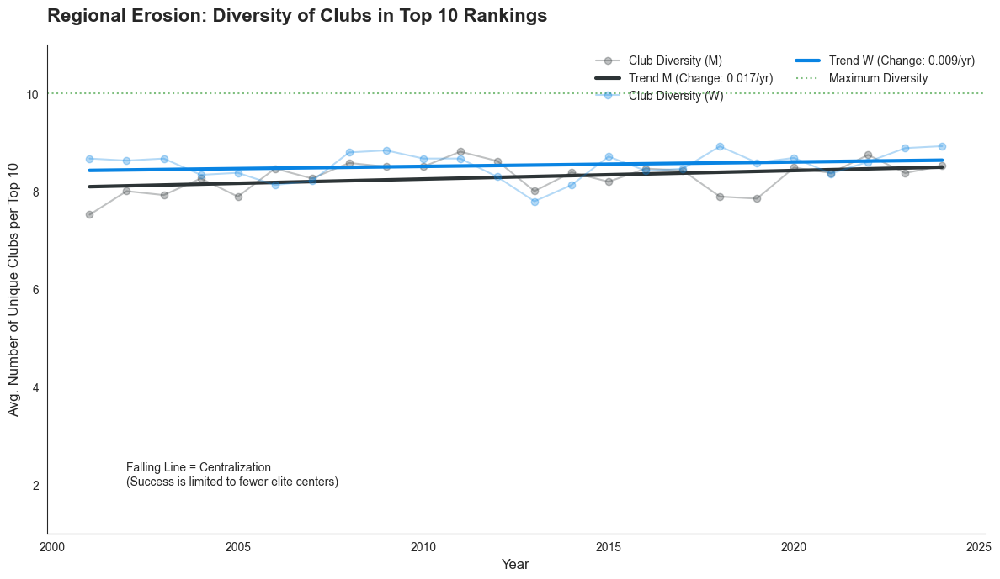

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_regional_clustering(df):
    # 1. Datenvorbereitung
    df_reg = df.copy()
    df_reg['iaaf_score'] = pd.to_numeric(df_reg['iaaf_score'], errors='coerce')
    df_reg = df_reg.dropna(subset=['iaaf_score', 'verein'])

    # 2. Analyse der Vereins-Vielfalt pro Jahr und Disziplin
    # Wir schauen uns die Top 10 pro Disziplin/Geschlecht an
    top_10 = df_reg[df_reg['altersklasse'].isin(['Maenner', 'Frauen'])].sort_values(
        ['jahr', 'disziplin', 'geschlecht', 'iaaf_score'], ascending=[True, True, True, False]
    )
    top_10 = top_10.groupby(['jahr', 'disziplin', 'geschlecht']).head(10)

    # Wir berechnen: Wie viele EINDEUTIGE Vereine stellen diese Top 10?
    # Wert 10 = Totale Breite (jeder Athlet anderer Verein)
    # Wert 1 = Totale Monokultur (ein Verein dominiert alles)
    club_diversity = top_10.groupby(['jahr', 'disziplin', 'geschlecht'])['verein'].nunique().reset_index()
    club_diversity.rename(columns={'verein': 'unique_clubs_count'}, inplace=True)

    # 3. Aggregation über alle Disziplinen pro Jahr
    annual_diversity = club_diversity.groupby(['jahr', 'geschlecht'])['unique_clubs_count'].mean().reset_index()

    # 4. Visualisierung
    plt.figure(figsize=(12, 7))
    sns.set_style("white")
    
    colors = {'M': '#2d3436', 'W': '#0984e3'}
    
    for g in ['M', 'W']:
        subset = annual_diversity[annual_diversity['geschlecht'] == g]
        # Wir glätten den Graphen leicht (Moving Average), um den langfristigen Trend zu zeigen
        plt.plot(subset['jahr'], subset['unique_clubs_count'], 
                 label=f'Club Diversity ({g})', color=colors[g], marker='o', alpha=0.3)
        
        # Trendlinie (Regressionslinie)
        z = np.polyfit(subset['jahr'], subset['unique_clubs_count'], 1)
        p = np.poly1d(z)
        plt.plot(subset['jahr'], p(subset['jahr']), color=colors[g], linewidth=3, 
                 label=f'Trend {g} (Change: {z[0]:.3f}/yr)')

    # Design
    plt.axhline(10, color='green', linestyle=':', alpha=0.5, label='Maximum Diversity')
    plt.title('Regional Erosion: Diversity of Clubs in Top 10 Rankings', 
              fontsize=16, fontweight='bold', loc='left', pad=20)
    plt.ylabel('Avg. Number of Unique Clubs per Top 10', fontsize=12)
    plt.xlabel('Year', fontsize=12)
    plt.ylim(1, 11)
    
    # Interpretationstext
    plt.text(2002, 2, "Falling Line = Centralization\n(Success is limited to fewer elite centers)", 
             bbox=dict(facecolor='white', alpha=0.5))

    plt.legend(frameon=False, loc='upper right', ncol=2)
    sns.despine()
    plt.tight_layout()
    plt.show()

    return annual_diversity

# Ausführung
regional_results = plot_regional_clustering(df)

#### 100 m Vergleich

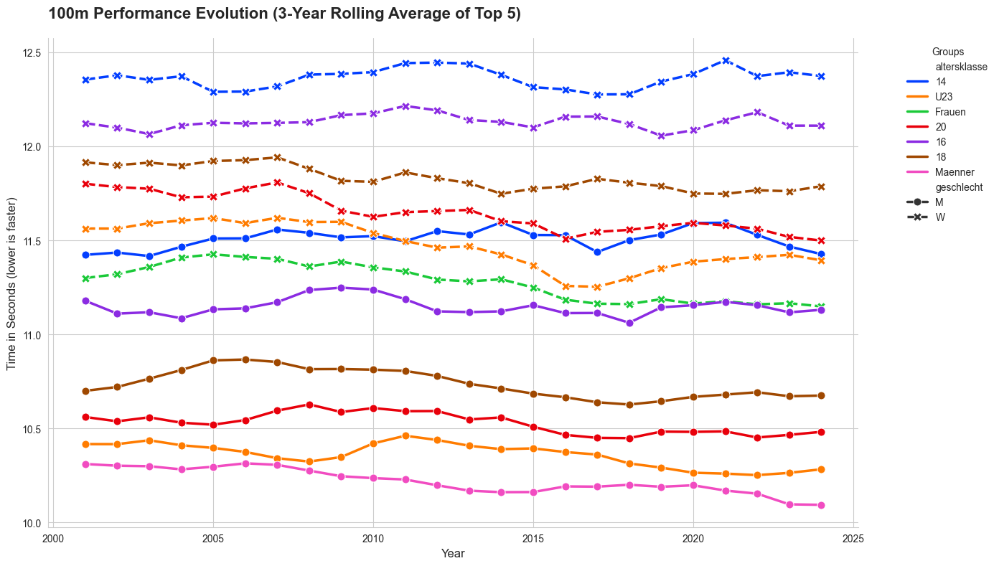

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_100m_trends_seconds(df):
    # 1. Daten filtern
    # Wir filtern auf 100m und stellen sicher, dass die Leistung numerisch ist
    df_100 = df[df['disziplin'] == '100 m'].copy()
    df_100['leistung'] = pd.to_numeric(df_100['leistung'].str.replace(',', '.'), errors='coerce')
    df_100 = df_100.dropna(subset=['leistung'])

    # 2. Aggregation der Top-Leistungen
    # Wir berechnen den Durchschnitt der Top 5 Leistungen pro Jahr, Geschlecht und Altersklasse
    # (Top 5 gibt ein stabileres Bild der nationalen Spitze als nur Platz 1)
    annual_top = df_100.groupby(['jahr', 'geschlecht', 'altersklasse'])['leistung'].nsmallest(5).groupby(level=[0,1,2]).mean().reset_index()

    # 3. 3-Jahres-Mittelung (Rolling Average)
    # Wir sortieren erst nach Jahr, um das gleitende Mittel korrekt zu berechnen
    annual_top = annual_top.sort_values('jahr')
    annual_top['leistung_smooth'] = annual_top.groupby(['geschlecht', 'altersklasse'])['leistung'].transform(
        lambda x: x.rolling(window=3, min_periods=1, center=True).mean()
    )

    # 4. Plotting
    plt.figure(figsize=(14, 8))
    sns.set_style("whitegrid")

    # Wir nutzen unterschiedliche Linienstile für Männer/Frauen und Farben für die Altersklassen
    # (Hier kannst du die Altersklassen anpassen, falls sie in deinem DF anders heißen)
    palette = sns.color_palette("bright", n_colors=annual_top['altersklasse'].nunique())
    
    sns.lineplot(data=annual_top, x='jahr', y='leistung_smooth', 
                 hue='altersklasse', style='geschlecht', 
                 palette=palette, linewidth=2.5, markers=True, markersize=8)

    # Da Sekunden geplottet werden: Invertieren der Y-Achse für bessere Lesbarkeit? 
    # (Optional: Normalerweise ist im Sprint "unten" besser, aber eine abfallende Kurve visualisiert "schneller")
    # Ich lasse sie normal, damit man die Sekunden direkt ablesen kann.
    
    plt.title('100m Performance Evolution (3-Year Rolling Average of Top 5)', 
              fontsize=16, fontweight='bold', loc='left', pad=20)
    plt.ylabel('Time in Seconds (lower is faster)', fontsize=12)
    plt.xlabel('Year', fontsize=12)
    
    # Legende außerhalb platzieren
    plt.legend(title="Groups", bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)
    
    sns.despine()
    plt.tight_layout()
    plt.show()

plot_100m_trends_seconds(df)